# COCO
* The Coco format is compatible with a wide range of tools...


In [1]:
# Based on:
# https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=Ya5nEuMELeq8

In [2]:
!pip3 install torch torchvision torchaudio
!pip3 install tensorboard
# If running on osx
!pip3 install git+https://github.com/cocodataset/panopticapi.git
#!export ARCHFLAGS="-arch x86_64" && CC=clang CXX=clang++ pip3 install pycocotools
#!pip3 install pycocotools
!pip3 install 'git+https://github.com/facebookresearch/detectron2.git'

     |████████████████████████████████| 1.9 MB 8.4 MB/s 
  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-req-build-c9b2kcdt
  Running command git clone -q https://github.com/cocodataset/panopticapi.git /tmp/pip-req-build-c9b2kcdt
  Created wheel for panopticapi: filename=panopticapi-0.1-py3-none-any.whl size=8306 sha256=677c54eb76ab7dfa9e0a39632ab47625078fbabccece250440b6c0c0d4d2c9b4
  Stored in directory: /tmp/pip-ephem-wheel-cache-de852wlk/wheels/ad/89/b8/b66cce9246af3d71d65d72c85ab993fd28e7578e1b0ed197f1
Successfully built panopticapi
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-ztqb0d6z
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-ztqb0d6z
     |████████████████████████████████| 49 kB 5.1 MB/s 
     |████████████████████████████████| 74 kB 3.5 MB/s 
     |████████████████████████████████| 144 kB 24.1 MB/s 
     |████████████████████████████████| 130 kB 52.7 MB/s 
     

In [3]:
!pip install "git+https://github.com/Labelbox/labelbox-python@ms/coco#egg=labelbox[data]"

  Cloning https://github.com/Labelbox/labelbox-python (to revision ms/coco) to /tmp/pip-install-cofyc5wr/labelbox_326f6c4f48b74c49b18af29a4205673e
  Running command git clone -q https://github.com/Labelbox/labelbox-python /tmp/pip-install-cofyc5wr/labelbox_326f6c4f48b74c49b18af29a4205673e
  Running command git checkout -b ms/coco --track origin/ms/coco
  Switched to a new branch 'ms/coco'
  Branch 'ms/coco' set up to track remote branch 'ms/coco' from 'origin'.
     |████████████████████████████████| 10.1 MB 11.7 MB/s 
     |████████████████████████████████| 19.3 MB 1.2 MB/s 
  Created wheel for labelbox: filename=labelbox-3.0.1-py3-none-any.whl size=125096 sha256=5897bad067a5f5acef74c626f01d26870fd3a6eb1d1ee4dbd352702d398814b0
  Stored in directory: /tmp/pip-ephem-wheel-cache-kwnt61ox/wheels/b7/b3/1d/e0a6d48b3d7eeb7b79b63e1bf24e669ad743066acfe8afcee1
Successfully built labelbox


In [151]:
from labelbox import Client, LabelingFrontend, OntologyBuilder
import os
from labelbox.data.serialization import COCOConverter 
from labelbox.data.annotation_types import Mask, MaskData, ClassificationAnnotation, ObjectAnnotation, Text, LabelList
from detectron2.data.datasets import register_coco_instances,register_coco_panoptic
import cv2
import requests
import random
import numpy as np
from detectron2.config import get_cfg
from detectron2.data.datasets.coco import load_coco_json
from detectron2.engine import DefaultPredictor
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo
from PIL import Image
from labelbox.data.annotation_types import Point, Rectangle, Polygon, ImageData, Label
import torch
import json
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

with open('./coco_utils.py', 'w' ) as file:
    helper = requests.get("https://raw.githubusercontent.com/Labelbox/labelbox-python/ms/coco/examples/integrations/detectron2/coco_utils.py").text
    file.write(helper)
    
from coco_utils import visualize_coco_examples, visualize_object_inferences, partition_coco

## Configure Paths:
* `image_root` - Where to write images to on disk
* `mask_root` - Where to write semantic segmentation masks to on disk
* `train_json_path` - Where the test partition coco dataset will be written to
* `train_json_path` - Where the train partition coco dataset will be written to
* `train_test_split` - How much of the data to add to each parition (by percent)
* `model_zoo_config` - Detectron2 model config see more here : https://github.com/facebookresearch/detectron2/blob/master/detectron2/model_zoo/model_zoo.py 


In [10]:
project_id = "ckpzz9dn50quz0yarekmq6fxm" #"ckputryh2000h0y8b65dfbo9r" #"ckq4q69ru004f0yah8sj289v2" #"ckputryh2000h0y8b65dfbo9r" #"ckq4q69ru004f0yah8sj289v2"
image_root = "/tmp/images/"
mask_root = "/tmp/masks/"
train_json_path = '/tmp/json_train_annotations.json'
test_json_path = '/tmp/json_test_annotations.json'
train_test_split = [0.8, 0.2]
model_zoo_config = "COCO-InstanceSegmentation/mask_rcnn_R_50_C4_1x.yaml"
train_ds_name = "custom_coco_train"
test_ds_name = "custom_coco_test"

* Set up directory structure

In [15]:
proj = client.get_project(project_id)
labels = proj.label_generator(timeout_seconds = 120.)

if not os.path.exists(image_root):
    os.mkdir(image_root)

if not os.path.exists(mask_root):
    os.mkdir(mask_root)

coco = COCOConverter.serialize_instances(
    labels = labels, 
    image_root = image_root
)

train_partition, test_partition = partition_coco(coco, splits = [0.8, 0.2])

for parition, file_name in [[train_partition, train_json_path], [test_partition, test_json_path]]:
    with open(file_name, 'w') as file:
        json.dump(parition['instance'], file)


145it [00:38,  3.77it/s]


In [16]:
register_coco_instances(train_ds_name, {}, train_json_path, image_root)
register_coco_instances(test_ds_name, {}, test_json_path, image_root)

[08/16 00:30:26 d2.data.datasets.coco]: Loaded 29 images in COCO format from /tmp/json_test_annotations.json


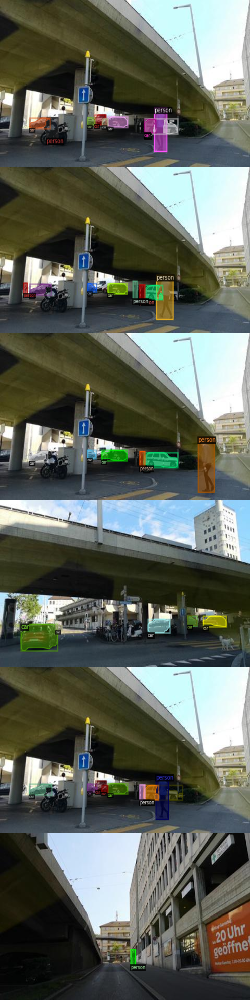

In [23]:
MetadataCatalog.get(test_ds_name).thing_classes = {r['id'] : r['name'] for r in coco['categories']}
test_json = load_coco_json(test_json_path, image_root)
visualize_coco_examples(test_json, MetadataCatalog.get(test_ds_name), resize_dims = (768, 512))

In [44]:
if hasattr(MetadataCatalog.get(train_ds_name), 'thing_classes'):
    del MetadataCatalog.get(train_ds_name).thing_classes
if hasattr(MetadataCatalog.get(test_ds_name), 'thing_classes'):
    del MetadataCatalog.get(test_ds_name).thing_classes    

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_zoo_config))
cfg.DATASETS.TRAIN = (train_ds_name,)
cfg.DATASETS.TEST = (test_ds_name,)
cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_zoo_config)  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 180
cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(coco['categories']) 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 

trainer.resume_or_load(resume=False)
trainer.train()


[08/16 00:37:29 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (5, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (16, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) 

[08/16 00:37:29 d2.engine.train_loop]: Starting training from iteration 0
[08/16 00:37:43 d2.utils.events]:  eta: 0:01:46  iter: 19  total_loss: 3.223  loss_cls: 1.61  loss_box_reg: 0.8057  loss_mask: 0.693  loss_rpn_cls: 0.08432  loss_rpn_loc: 0.01141  time: 0.6628  data_time: 0.0182  lr: 2.6612e-05  max_mem: 3129M
[08/16 00:37:56 d2.utils.events]:  eta: 0:01:34  iter: 39  total_loss: 2.714  loss_cls: 1.209  loss_box_reg: 0.7102  loss_mask: 0.6795  loss_rpn_cls: 0.07674  loss_rpn_loc: 0.01294  time: 0.6705  data_time: 0.0086  lr: 5.4363e-05  max_mem: 3129M
[08/16 00:38:09 d2.utils.events]:  eta: 0:01:19  iter: 59  total_loss: 2.202  loss_cls: 0.6925  loss_box_reg: 0.8333  loss_mask: 0.6427  loss_rpn_cls: 0.05258  loss_rpn_loc: 0.01322  time: 0.6631  data_time: 0.0077  lr: 8.2113e-05  max_mem: 3129M
[08/16 00:38:22 d2.utils.events]:  eta: 0:01:06  iter: 79  total_loss: 1.971  loss_cls: 0.5207  loss_box_reg: 0.8009  loss_mask: 0.5993  loss_rpn_cls: 0.04506  loss_rpn_loc: 0.01283  time: 

In [27]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [28]:
# Use this for validation if you would like..
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator(test_ds_name)
val_loader = build_detection_test_loader(cfg, test_ds_name)
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[08/16 00:34:33 d2.data.datasets.coco]: Loaded 29 images in COCO format from /tmp/json_test_annotations.json
[08/16 00:34:33 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/16 00:34:33 d2.data.common]: Serializing 29 elements to byte tensors and concatenating them all ...
[08/16 00:34:33 d2.data.common]: Serialized dataset takes 0.05 MiB
[08/16 00:34:33 d2.evaluation.evaluator]: Start inference on 29 batches
[08/16 00:34:39 d2.evaluation.evaluator]: Inference done 11/29. Dataloading: 0.0027 s/iter. Inference: 0.4341 s/iter. Eval: 0.0208 s/iter. Total: 0.4576 s/iter. ETA=0:00:08
[08/16 00:34:44 d2.evaluation.evaluator]: Inference done 21/29. Dataloading: 0.0026 s/iter. Inference: 0.4667 s/iter. Eval: 0.0249 s/iter. Total: 0.4944 s/iter. ETA=0:00:03
[08/16 00:34:48 d2.evaluation.evaluator]: Total inference time: 0:00:12.193195 (0.508050 s / iter per device, on 1 devices)

In [197]:
# We can use `Visualizer` to draw the predictions on the image.

# Export Data From Catalog or another dataset here..
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7 
predictor = DefaultPredictor(cfg)
test_json = load_coco_json(test_json_path, image_root)
del MetadataCatalog.get(test_ds_name).thing_classes
MetadataCatalog.get(test_ds_name).thing_classes = {idx : r['name'] for idx, r in enumerate(coco['categories'])}


[08/16 01:59:37 d2.data.datasets.coco]: Loaded 29 images in COCO format from /tmp/json_test_annotations.json


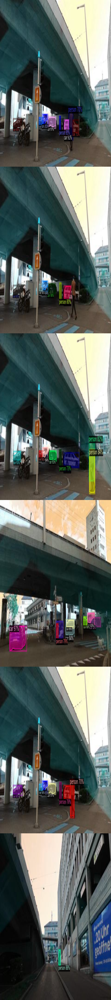

In [199]:
 def visualize_object_inferences(coco_examples, metadata_catalog, predictor, scale = 1.0, max_images = 5, resize_dims = (512, 768)):
     images = []
     for idx, example in enumerate(coco_examples):
         if idx > max_images:
             break
         im = cv2.imread(example['file_name'])
         outputs = predictor(im)
         v = Visualizer(im[:, :, ::-1], metadata_catalog, scale=scale)
         out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
         images.append(cv2.resize(out.get_image()[:, :, ::-1], resize_dims))
     return Image.fromarray(np.vstack(images))
visualize_object_inferences(test_json, MetadataCatalog.get(test_ds_name), predictor)

In [31]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
predictor = DefaultPredictor(cfg)
# for single test image

In [248]:

labels = LabelList()
from tqdm import tqdm
from shapely.geometry import MultiPolygon

# Some additional unlabeled data rows
dataset = client.get_dataset("ckrwmctsr0kik0y2c41uvdb3e")





# TODO: Convert all to numpy and then iterate. I don't think we are doing this right..
for data_row in tqdm(data_rows()):
  image = ImageData(url = data_row.row_data, uid = data_row.uid, external_id = data_row.external_id)
  res = predictor(image.value)
  annotations = []
  for idx in range(len(res['instances'])):
    mask = MaskData.from_2D_arr(res['instances'][idx].pred_masks[0].cpu().numpy().astype(np.uint8))
    mask = Mask(mask = mask, color = (1,1,1))
    geom = mask.shapely.buffer(0).simplify(3)
    if isinstance(geom, MultiPolygon):
      geom = geom.convex_hull

    annotations.append(ObjectAnnotation(
        name = MetadataCatalog.get(test_ds_name).thing_classes[res['instances'][idx].pred_classes[0].cpu().numpy().item()],
        value = Polygon(points = [Point(x=x,y=y) for x,y in list(geom.exterior.coords)]),
        #classifications = [ClassificationAnnotation(
        #    name = "score",
        #    value = Text(answer = str(res['instances'][idx].scores[0].cpu().numpy().item()))
        #)]
    ))
  labels.append(Label(
      data = image,
      annotations = annotations      
  ))


100it [03:37,  2.17s/it]


In [249]:

project = client.create_project(name = "detectron_labels")
editor = next(
    client.get_labeling_frontends(where=LabelingFrontend.name == 'editor'))

project.setup(editor, labels.get_ontology().asdict())
project.enable_model_assisted_labeling()
project.datasets.connect(dataset)



In [250]:

signer = lambda _bytes: client.upload_data(content=_bytes, sign=True)
labels.add_url_to_masks(signer) \
         .add_url_to_data(signer) \
         .assign_feature_schema_ids(OntologyBuilder.from_project(project))


100it [00:00, 116605.62it/s]
100it [00:00, 208879.68it/s]


In [251]:
from labelbox.data.serialization import NDJsonConverter

In [252]:
ndjsons = list(NDJsonConverter.serialize(labels))
import uuid
upload_task = project.upload_annotations(name=f"upload-job-{uuid.uuid4()}",
                                         annotations=ndjsons,
                                         validate=False)
# Wait for upload to finish
upload_task.wait_until_done()

In [253]:

# Review the upload status
for status in upload_task.statuses[:20]:
    print(status)

{'uuid': '96388161-fe86-4edf-9396-42f050e33a53', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '7d9b0eb9-41bc-495d-95ac-3ea124749dd6', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '8a07a948-18f0-4815-823d-d86afea25663', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': 'fe5817b7-b06b-45a0-b6ed-672edb4955b6', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '0d3c9c99-9435-4168-a9eb-52f87de6833b', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '8c35f348-3414-4d12-a765-95a5b2cc5488', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '756e3507-f376-4b17-aa0a-23d3202148c9', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': 'ec7ff5be-b0d8-406c-837c-db51fcbd1194', 'dataRow': {'id': 'ckrwmcufa0j5b0ysu4sl30bd5'}, 'status': 'SUCCESS'}
{'uuid': '700ab96f-fbf3-4379-b171-ab6d54a21009', 'dataRo